In [1]:
## install polyase
## conda create polyase
## conda activate polyase
## pip install -i https://test.pypi.org/simple/ polyase==0.1.2
## conda install jupyterlab
## conda install ipykernel

import polyase as poly
import os
import numpy as np
import pandas as pd
import RNApysoforms as RNApy
import polars as pl


/users/nadjafn/.conda/envs/polyase/lib/python3.12/site-packages/sorted_nearest/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


In [2]:
!pwd


/DKED/scratch/nadjafn/VALT_Summer_Course/practicals/day3/allelespecificexpression/notebooks


# Allele specific expression analysis practical

In the following 1h we will analyze a long-read RNA-seq potato dataset for allele specific expression.
1) We will look at the data and how it was obtained

2) We will learn about quality control steps in allele-specific expression analysis and apply it to our data

3) We will test if there is any difference in expression between alleles within conditions (cis)

4) We will test if haplotypes differ in which isoform (splice variant) they predominantly use for a gene

## Sample info

- 10 samples of Potato cv Atlantic
- Two conditions (tubers, leaves) (but we will only use leaves for this tutorial)
- tetraploid --> 4 haplotypes

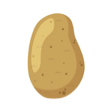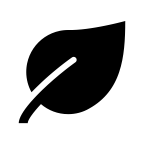

long-read RNA-seq was generated for genome annotation from this [article](https://www.sciencedirect.com/science/article/pii/S167420522200003X) by nanopore cDNA sequencing and is available on [SRA](https://www.ncbi.nlm.nih.gov/bioproject/PRJNA718240)

## Available Files (in data/allele_expression)
1) var_obs_file:<br>
    Gene metadata
2) gene_counts:<br>
    Allele-specific counts for genes in each haplotype and by sample
3) Bigwig files of aligned reads for visualization



### How did we generate the allele-specific counts?


1) Map with minimap2 to transcripts <br>
We count reads mapping uniquely to one allele, and quantify multimapping reads with Oarfish (e.g. when there is no difference between alleles/genes, or reads are too short to differentiate alleles)

# 1) Loading the allele-specific count data 

First we load in the allele-specific counts for our 10 samples (ONT cDNA from 5 x potato tubers, 5 x potato leaves). We also have some metadata ("metadata.tsv") that links the gene ids from the alleles of a gene together with "Synt_ids" and we have some information about the allele lengths that we use for quality control.

In [3]:
input_dir = "/scratch/nadjafn/polyase_tutorial_atlantic"

# File with syntelog categories from SyntelogFinder
var_obs_file = f"{input_dir}/genespace/unitato2Atl.no_scaffold.no_hap0_genespace_categories.tsv"
# Directory of gene counts from oarfish generated by long-read quantification pipeline
gene_counts_dir = f"{input_dir}/oarfish/"
tx2gene = f"{input_dir}/custom/combined.tx2gene.tsv"

In [29]:
# Define sample IDs and their conditions
sample_info = {
    "SRR14993892": "leaf",
    "SRR14993893": "leaf",
    "SRR14993894": "leaf",
    "SRR14993895": "leaf",
    "SRR14996168": "leaf",
    "SRR14995031": "tuber",
    "SRR14995032": "tuber",
    "SRR14995033": "tuber",
    "SRR14995034": "tuber",
    "SRR14995933": "tuber"
} 

# With isoforms
adata_isoform = poly.load_ase_data(
    var_obs_file=var_obs_file,
    sample_info=sample_info,
    tx_to_gene_file=tx2gene,
    isoform_counts_dir=gene_counts_dir,
    quant_dir=gene_counts_dir
)

Loading metadata files...


Loading counts for 10 samples in parallel...
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Oarfish quant.sf format detected
Successfully loaded 10 out of 10 samples
Concatenating count matrices...
Found transcript lengths from sample 'SRR14993895'
Creating isoform metadata...
Added 'tx_length' to .var for 250224/250224 transcripts
Adding var_obs annotations for 250224 transcripts...
Found 167997 genes with var_obs annotations
Found 33730 genes without var_obs annotations (will be filled with NaN)
Assigning Synt_id values...
Assigned Synt_id values for 33730 genes (41291 transcripts)
Keeping all 250224 transcripts from expression data
Statistics:
  - Total transcripts: 250224
  - Transcripts with gene_id annotation: 250224
  - Transcripts w

## Add functional annotation

In [6]:
# Load functional annotation data
annotation_file = f"{input_dir}/Phureja_v4-v6.1_translations.xlsx"
df_annotation = pd.read_excel(annotation_file)
df_annotation = df_annotation.iloc[:, 1:3]
df_annotation.columns = ['gene_id_unitato', 'functional_annotation']

# Remove version suffix from gene IDs (e.g., "GENE.1" -> "GENE")
adata_isoform.var['gene_id_unitato'] = adata_isoform.var['gene_id'].str.rsplit('.', n=1).str[0]
adata_isoform.var['original_index'] = adata_isoform.var.index

# Merge annotations
merged_data = pd.merge(
    adata_isoform.var,
    df_annotation,
    on='gene_id_unitato',
    how='left'
)

# Remove duplicates and restore index
merged_data = merged_data.drop_duplicates(subset=['original_index', 'gene_id'], keep='first')
merged_data.index = merged_data['original_index']
merged_data = merged_data.drop(columns=['original_index'])

# Update AnnData object
adata_isoform.var = merged_data



In [ ]:
adata_isoform.var

,transcript_id,gene_id,feature_type,tx_length,Synt_id,synteny_category,syntenic_genes,haplotype,CDS_length_category,CDS_haplotype_with_longest_annotation,gene_id_unitato,functional_annotation
original_index,,,,,,,,,,,,
Soltu.DM.01G003640.1.Hap1,Soltu.DM.01G003640.2.Hap1,Soltu.DM.01G003640.Hap1,transcript,5061,Synt_id_8839,1hap1_1hap2_1hap3_1hap4_s,"Soltu.DM.01G003640.2.Hap1,Soltu.DM.01G003640.2...",hap1,less_1%_difference,1G,Soltu.DM.01G003640,histone acetyltransferase of the CBP family/hi...
Soltu.DM.12G026380.1.Hap3,Soltu.DM.12G026380.1.Hap3,Soltu.DM.12G026380.Hap3,transcript,735,Synt_id_62122,1hap1_1hap2_1hap3_1hap4_s,"Soltu.DM.12G026380.1.Hap1,Soltu.DM.12G026380.1...",hap3,more_1%_difference,1G,Soltu.DM.12G026380,SAUR-like auxin-responsive protein family
Soltu.DM.08G014300.1.Hap2,Soltu.DM.08G014300.1.Hap2,Soltu.DM.08G014300.Hap2,transcript,4509,Synt_id_46693,1hap1_1hap2_1hap3_1hap4_s,"Soltu.DM.08G014300.1.Hap1,Soltu.DM.08G014300.1...",hap2,more_1%_difference,1G,Soltu.DM.08G014300,"polyribonucleotide nucleotidyltransferase, put..."
PGSC0003DMT400090574.Hap1,PGSC0003DMT400090574.Hap1,PGSC0003DMG400040145.Hap1,transcript,327,Synt_id_32439,1hap1_1hap2_1hap3_1hap4_s,"PGSC0003DMT400090574.Hap1,PGSC0003DMT400090574...",hap1,more_20%_difference,1G,PGSC0003DMG400040145,NaN
Soltu.DM.05G021270.1.Hap2,Soltu.DM.05G021270.1.Hap2,Soltu.DM.05G021270.Hap2,transcript,594,Synt_id_35098,1hap1_1hap2_1hap3_1hap4_s,"Soltu.DM.05G021270.1.Hap1,Soltu.DM.05G021270.1...",hap2,more_1%_difference,1G,Soltu.DM.05G021270,conserved hypothetical protein


## Column Definitions

#### transcript_id
Unique identifier for each individual transcript.

#### Synt_id
Identifier for each gene. Multiple transcripts (alleles) that belong to the same gene share the same Synt_id.

#### synteny_category
Indicates the haplotype distribution for each gene using the format:
`{count}hap{number}_{count}hap{number}_..._{synteny_status}`

**Example:** `2hap1_2hap2_0hap3_1hap4_no_s`
- 2 copies on haplotype 1
- 2 copies on haplotype 2  
- 0 copies on haplotype 3
- 1 copy on haplotype 4
- `no_s` = non-syntenic (vs `s` = syntenic)

#### CDS_haplotype_with_longest_annotation
Identifies which haplotype contains the gene with the longest annotation length.

**Values:**
- `1G`/`2G`/`3G`/`4G` = haplotype 1/2/3/4 has the longest annotation
- `equal_lengths` = all haplotypes have identical longest length

#### CDS_length_category
Describes the length variation between the longest and shortest alleles of the same gene.

**Examples:**
- `less_1%_difference` = minimal length variation
- `more_5%_difference` = significant length variation

#### TASK:

Look at the 'Kinase binding protein CGI-121 domain containing protein' in the [jBrowse](https://spuddb.uga.edu/jb2/?session=share-5XsMBKZFzB&password=SKUoM).

## **Question**: 

1) Which synteny category would you assign the 'Kinase binding protein CGI-121 domain containing protein' to?

2) Now find the "hypothetical protein" next to it. Which synteny category should it be?

#### Answer

**1hap1_1hap2_1hap3_1hap4_s** because it is once on every haplotype and has the same genes as neighbours on the haplotypes

Example for synteny_category:
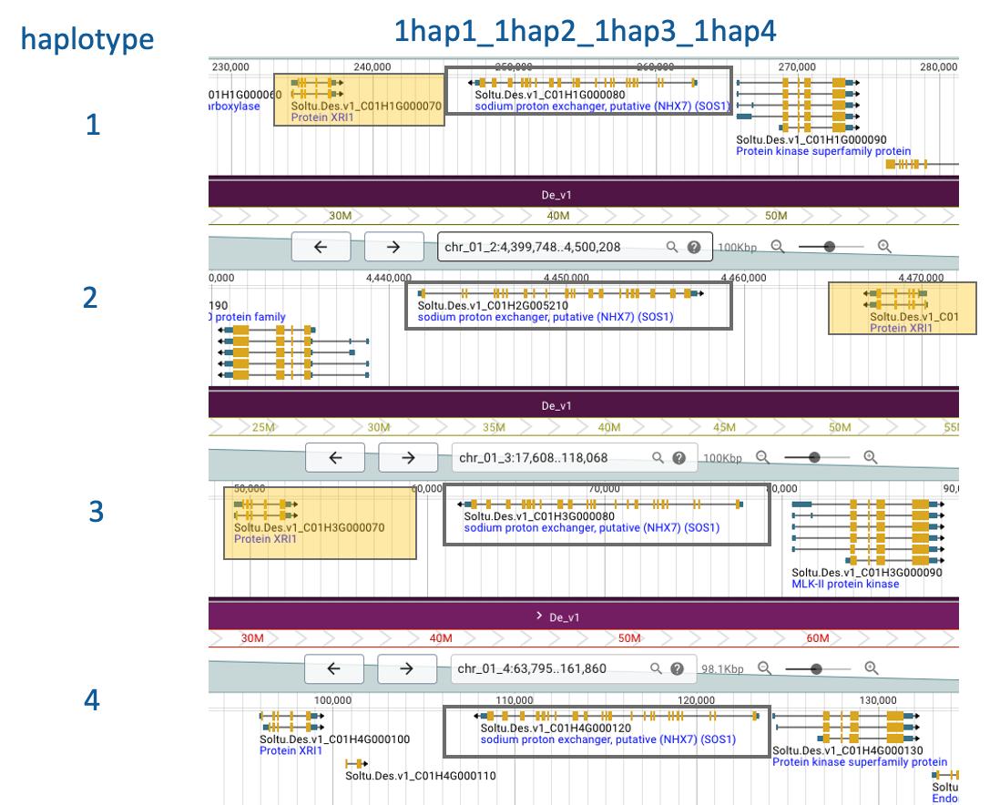

## Look at the information of counts

In [8]:
adata_isoform.layers['unique_counts']

array([[0, 0, 1, ..., 1, 0, 0],
       [0, 0, 1, ..., 3, 0, 1],
       [0, 0, 0, ..., 2, 0, 2],
       ...,
       [0, 0, 0, ..., 2, 0, 2],
       [0, 0, 2, ..., 0, 0, 2],
       [0, 0, 0, ..., 0, 0, 0]], shape=(10, 250224))

In [9]:
adata_isoform.layers["ambiguous_counts"]

array([[  5,  16,  20, ...,   5,   0,   0],
       [ 11,  33,  49, ...,  10,   0,  13],
       [ 36,  89, 195, ...,  18,   0,  42],
       ...,
       [  1,  78,  32, ...,   0,   0,  13],
       [  0,  55,  28, ...,   2,   0,   4],
       [  1,  38,  23, ...,   1,   0,   8]], shape=(10, 250224))

In [10]:
adata_isoform.var_names

Index(['Soltu.DM.05G018690.1.Hap2', 'Soltu.DM.08G017010.1.Hap2',
       'Soltu.DM.06G008230.2.Hap2', 'Soltu.DM.12G027030.1.Hap0',
       'Soltu.DM.04G035990.1.Hap2', 'Soltu.DM.04G033360.1.Hap4',
       'Soltu.DM.10G020260.1.Hap2', 'BambuTx7764', 'PGSC0003DMT400070843.Hap2',
       'Soltu.DM.02G010910.1.Hap3',
       ...
       'Soltu.DM.12G023950.1.Hap1', 'PGSC0003DMT400093890.Hap3',
       'Soltu.DM.03G034930.1.Hap1', 'Soltu.DM.08G012000.1.Hap4',
       'Soltu.DM.04G027920.1.Hap2', 'Soltu.DM.09G025120.2.Hap2',
       'Soltu.DM.02G009780.1.Hap4', 'Soltu.DM.08G022600.2.Hap3',
       'PGSC0003DMT400092484.Hap3', 'Soltu.DM.10G003260.4.Hap3'],
      dtype='object', name='original_index', length=250224)

In [11]:
adata_isoform.obs

,condition,em_lib_size,unique_lib_size,ambig_lib_size,total_lib_size
SRR14993892,leaf,1314624.0,791265,1518961,2310226
SRR14993895,leaf,3207895.0,1914658,3787858,5702516
SRR14993894,leaf,6524167.0,3596141,8846994,12443135
SRR14993893,leaf,711674.0,409917,905189,1315106
SRR14995031,tuber,3400701.0,2067455,3678719,5746174
SRR14995032,tuber,2331378.0,1600586,1884046,3484632
SRR14996168,leaf,4510475.0,2699095,5260268,7959363
SRR14995033,tuber,3108348.0,2088492,2699295,4787787
SRR14995933,tuber,2146371.0,1471987,1754031,3226018
SRR14995034,tuber,1775877.0,1187663,1573220,2760883


* rows: our 10 replicates
* columns: the transcript_ids


# 2) Quality Control
Now that we inspected the count data and metadata, we can start to do some quality control.


## Criteria for quality control

- Filter low expressed genes
- High bias towards one allele
- Multimapping ratio
- Same CDS length

### A) Filter genes with low expression

We filter Syntelog groups that have low read counts, normalized by the samples' library size.

In [12]:
adata_gene = poly.aggregate_transcripts_to_genes(adata_isoform)

Aggregating 250224 transcripts to 201727 genes
Added mean/min/max transcript length columns to gene .var
synt_length_category: {'variable_length': 135406, 'uniform_length': 66321}
Created gene-level AnnData: 10 × 201727
Average transcripts per gene: 1.24


In [13]:
adata_gene_filtered = poly.filter_low_expressed_genes(
                        adata_gene,
                        min_expression=20.0,  # increase this in case of false positives due to high ploidy
                        mode= 'all',
                        #library_size_dependent=True, # this filters min_expression based on CPM of unique counts
                        verbose=True)

Using uniform threshold: 20.0
Filtered out 87776 groups
Kept 6461 / 201727 items


### B) High bias towards one allele
Calculate allelic ratios to see if there are genes that have high bias (e.g., > 0.6 of total counts) towards one allele.

For that we will calculate the allelic ratios simply by: allelic_ratio = allele counts/total counts for this gene.
We will use these allelic ratios to make a histogram later.

In [14]:
adata_gene_filtered = poly.calculate_allelic_ratios(adata_gene_filtered , 'unique_counts')
adata_gene_filtered = poly.calculate_allelic_ratios(adata_gene_filtered , 'em_counts')

In [15]:
adata_gene_filtered.layers["allelic_ratio_unique_counts"]

### Rows are replicates; columns are transcript ids

array([[0.48017621, 0.56329114, 0.        , ..., 0.        , 0.625     ,
        0.25806452],
       [0.48393195, 0.64      , 0.        , ..., 0.        , 0.35606061,
        0.32986111],
       [0.50642398, 0.70503597, 0.        , ..., 0.        , 0.224     ,
        0.29026549],
       ...,
       [0.352     , 0.64      , 0.        , ..., 0.        , 0.42986425,
        0.27777778],
       [0.31944444, 0.72222222, 0.        , ..., 0.        , 0.34507042,
        0.33333333],
       [0.33333333, 0.55      , 0.        , ..., 0.        , 0.43434343,
        0.32911392]], shape=(10, 6461))

### C) Multimapping Ratio

For each transcript_id we have the unique counts and the multimapping/ambiguous counts. We use this to calculate the multimapping ratio for each gene/Synt_id:

**Multimapping ratio formula:**
```
Multimapping ratio = number of ambiguous counts / number of total counts (unique + ambiguous)
```

Where:
- **Unique counts:** reads that map to only one location
- **Ambiguous counts:** reads that map to multiple locations (multimapping)
- **Total counts:** sum of unique and ambiguous counts



In [16]:
# now let's calculate the multimapping ratios for each Synt_id
adata_gene_filtered = poly.calculate_multi_ratios(adata_gene_filtered, 'unique_counts', 'ambiguous_counts')

In [17]:
# The multimapping information has also been added to the AnnData object
adata_gene_filtered.var.head()

,gene_id,feature_type,transcript_id,Synt_id,synteny_category,syntenic_genes,haplotype,CDS_length_category,CDS_haplotype_with_longest_annotation,functional_annotation,mean_tx_length,min_tx_length,max_tx_length,synt_length_category,n_transcripts,multimapping_ratio
Soltu.DM.11G000890.Hap1,Soltu.DM.11G000890.Hap1,gene,Soltu.DM.11G000890.1.Hap1,Synt_id_56022,1hap1_0hap2_1hap3_1hap4_s,"Soltu.DM.11G000890.1.Hap1,nan,Soltu.DM.11G0008...",hap1,None,None,conserved hypothetical protein,810.0,810,810,variable_length,1,0.036432
PGSC0003DMG400017936.Hap4,PGSC0003DMG400017936.Hap4,gene,PGSC0003DMT400046207.Hap4,Synt_id_6842,1hap1_2hap2_1hap3_2hap4_no_s,"Sotub06g007530.1.1.Hap1,PGSC0003DMT400046207.H...",hap4,None,None,None,865.0,865,865,variable_length,1,0.015424
Soltu.DM.12G007670.Hap1,Soltu.DM.12G007670.Hap1,gene,Soltu.DM.12G007670.1.Hap1,Synt_id_60416,1hap1_1hap2_1hap3_1hap4_s,"Soltu.DM.12G007670.1.Hap1,Soltu.DM.12G007670.1...",hap1,less_1%_difference,equal_lengths,Inositol monophosphatase family protein,1582.0,1582,1582,variable_length,1,0.465368
Soltu.DM.12G021880.Hap1,Soltu.DM.12G021880.Hap1,gene,Soltu.DM.12G021880.1.Hap1,Synt_id_61515,1hap1_1hap2_1hap3_1hap4_s,"Soltu.DM.12G021880.1.Hap1,Soltu.DM.12G021880.1...",hap1,less_1%_difference,equal_lengths,Pollen Ole e 1 allergen and extensin family pr...,555.0,555,555,variable_length,1,0.057280
Soltu.DM.07G024190.Hap1,Soltu.DM.07G024190.Hap1,gene,Soltu.DM.07G024190.1.Hap1,Synt_id_44305,1hap1_2hap2_1hap3_1hap4_no_s,"Soltu.DM.07G024190.1.Hap1,Soltu.DM.07G024190.1...",hap1,None,None,haloacid dehalogenase-like hydrolase family pr...,2220.0,2220,2220,variable_length,1,0.020102


#### Question: Why do some alleles have high multimapping ratios?

#### Answer

If two or more alleles are identical they will have all reads multimapping. Also if there are multiple copies of a gene on one haplotype, reads could multimap on this haplotype

#### QC Plot

Now we can make a histogram to show the distribution of allelic ratios for the genes with low multimapping ratios / ambiguous counts (GREEN) and high multimapping ratios / ambiguous counts (GREY)

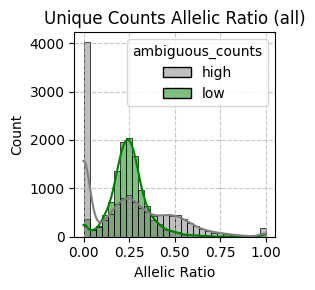

In [37]:
fig = poly.plot_allelic_ratios(
    adata_gene_filtered,
    synteny_category="1hap1_1hap2_1hap3_1hap4_s", 
    sample='all', 
    ratio_type="unique",
    figsize = (3,3),
    kde = True,
    multimapping_threshold=0.25
)

#### Task: 
Change the "multimapping_threshold" and see how the green distribution changes

### Question: 

Can you explain the differences between the green and grey distributions?

- Can you explain why most alleles with low multimapping ratios have 0.25 allelic ratio
- And what is the distribution for the genes with high multimapping ratios

### Answers:




#### Theoretical expectation
We expect that genes with four alleles have relatively equal expression across all four alleles, resulting in a ratio of **1/4 (0.25)** per allele.

#### Impact of multimapping
For genes with high multimapping rates, the distribution becomes skewed:

- **Problem:** Some alleles have no unique counts while others receive disproportionately more
- **Example scenario:** When two alleles are identical:
  - The identical alleles cannot be distinguished by unique reads
  - The remaining two distinguishable alleles each receive approximately **50% (0.5)** of the unique counts
  - This creates a characteristic bump at **0.5** in the expression ratio histogram

This multimapping bias explains the deviation from the expected equal distribution and highlights the importance of quality control filtering.

### D) Same CDS length

The last QC criterion is whether all four haplotype copies of a gene have the same annotated CDS length.

Length differences between haplotype copies are usually an **annotation artifact**, not real biology — e.g. a gene is correctly annotated as one full-length transcript on one haplotype, but truncated or split into two separate gene models on the others. When that happens, reads from the incompletely-annotated allele have nowhere to map, so they — along with ambiguous/multimapping reads — disproportionately align to the longer, correctly-annotated allele. This creates a strong apparent allelic bias that has nothing to do with true differences in expression.

To avoid this confound, before testing for genuine allelic imbalance we only keep genes where `CDS_haplotype_with_longest_annotation == "equal_lengths"`, i.e. all haplotype copies share the same annotated CDS length.

# 3) Testing for allelic imbalance

Now that we have the counts per allele and filtered genes that could be biased by high numbers of ambiguous reads and length differences, we want to test if there are genes that have unbalanced allelic expression (higher or lower than the expected 0.25).

For this we use the likelihood ratio test from [Isotools](https://isotools.readthedocs.io/en/latest/notebooks/09_diff_splice.html) to test if there is a significant difference between our observed allelic counts and 25% of the total counts.

Why do we only test one condition here? (not leaf and tuber at the same time)
Because between tissues we expect that there are also trans effects (different transcription factors), but within one condition only cis differences (promoters, ..) should be responsible for difference in expression. 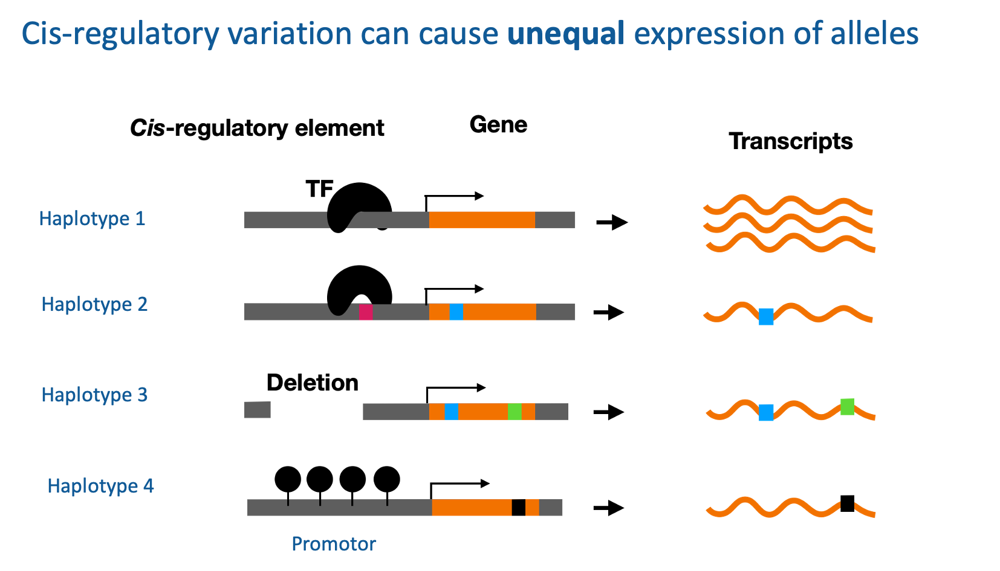

Using CPM data from layer: unique_cpm
Processing syntelog 100/205
Processing syntelog 200/205
Found 60 from 205 syntelogs with at least one significantly different allele (FDR < 0.05 and ratio difference > 0.1)


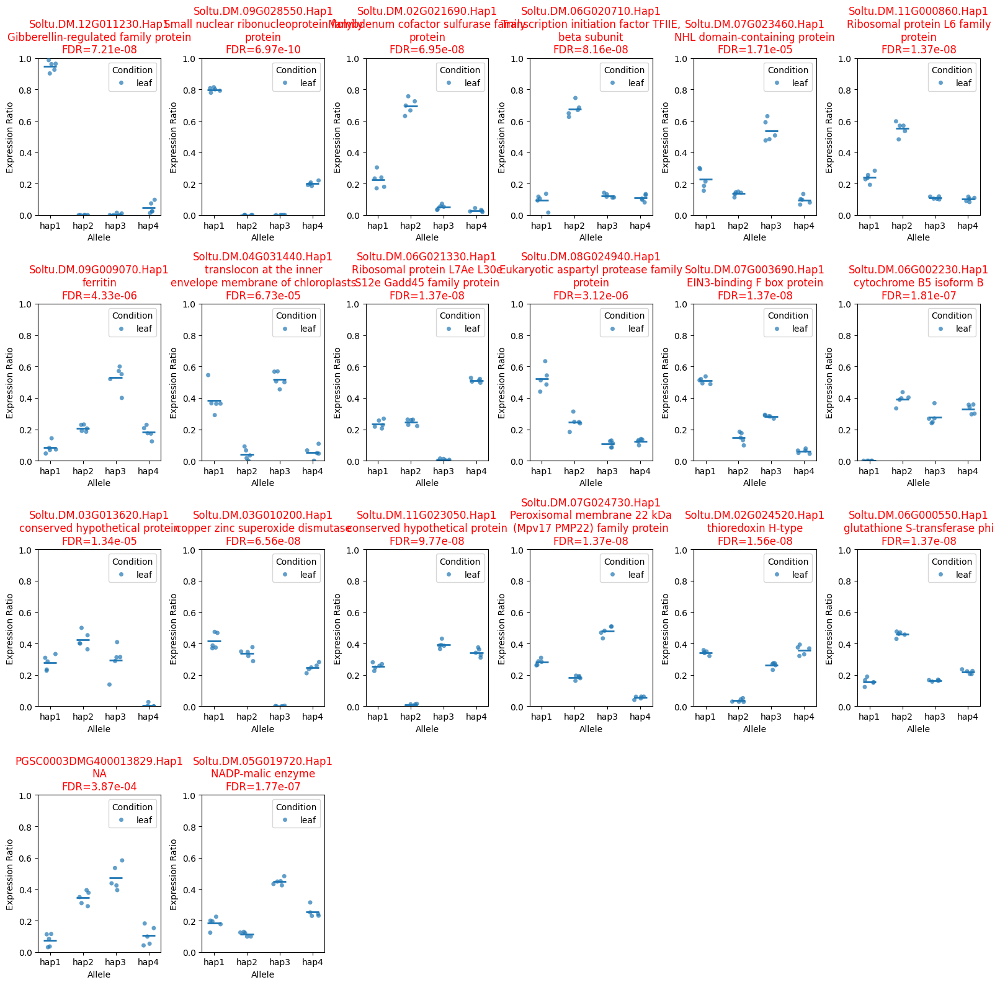

In [45]:
# Select only the genes with
# 1) equal lengths,
# 2) low multimapping ratio and
# 3) synteny category "1hap1_1hap2_1hap3_1hap4_s"
mask = (adata_gene_filtered.var["CDS_haplotype_with_longest_annotation"] == "equal_lengths" ) \
     & (adata_gene_filtered.var["multimapping_ratio"] < 0.25) \
     & (adata_gene_filtered.var["synteny_category"] == "1hap1_1hap2_1hap3_1hap4_s")

allelic_data_length_filter = adata_gene_filtered[:,mask].copy()

# Test for differential allelic ratios within conditions
results = poly.test_allelic_ratios_within_conditions(allelic_data_length_filter, layer="unique_counts", test_condition= "leaf", inplace=True)

# Plot the results
fig = poly.plot_top_differential_syntelogs(results, n=20, figsize=(16, 4*4), sort_by='ratio_difference')

The alleles with a red title have a significant change in the allelic ratio. Not all alleles have equal expression

## Checking alignments of genes

Let's look at the gene `Soltu.DM.06G020710` in more detail:

In [39]:
results[results["gene_id"].str.contains("Soltu.DM.06G020710")]

,Synt_id,allele,functional_annotation,gene_id,p_value,ratio_difference,n_alleles,ratios_leaf_mean,ratios_rep_leaf,cpm_leaf_mean,cpm_rep_leaf,FDR
497,Synt_id_38524,hap2,"Transcription initiation factor TFIIE, beta su...",Soltu.DM.06G020710.Hap2,1.991406e-09,0.405387,4,0.674758,"[0.6691176470588235, 0.6485355648535565, 0.625...",53.011777,"[69.22131347061973, 48.31828971958241, 42.4575...",8.164764e-08
499,Synt_id_38524,hap4,"Transcription initiation factor TFIIE, beta su...",Soltu.DM.06G020710.Hap4,2.060558e-06,0.144603,4,0.108776,"[0.08088235294117647, 0.13389121338912133, 0.0...",8.432170,"[8.367411518426561, 9.975388845333143, 6.59087...",2.955103e-05
498,Synt_id_38524,hap3,"Transcription initiation factor TFIIE, beta su...",Soltu.DM.06G020710.Hap3,4.148880e-06,0.123487,4,0.123076,"[0.1323529411764706, 0.11297071129707113, 0.14...",9.650483,"[13.692127939243464, 8.416734338249839, 9.6564...",5.154669e-05
496,Synt_id_38524,hap1,"Transcription initiation factor TFIIE, beta su...",Soltu.DM.06G020710.Hap1,9.918942e-06,0.145382,4,0.093390,"[0.11764705882352941, 0.10460251046025104, 0.1...",7.177343,"[12.170780390438635, 7.793272535416518, 9.1965...",1.056303e-04


The column "ratio_difference" is the difference between our mean allele ratio and the expected ratio (0.25).

Let's look at the expression for these alleles of one sample in the genome Browser https://spuddb.uga.edu/jb2/?session=share-81f3LArvPW&password=mPF6G. Does it really look like allele 2 has higher expression than the other alleles?




We will also add a bam file from one sample of the long-read RNA-seq data. The file is located here.

In the jBrowse click on the `Add a track` and then paste the two URLS:
- Main file: https://zenodo.org/api/records/20812985/files/SRR14993895.haplotagged.bam/content
- Index File: https://zenodo.org/api/records/20812985/files/SRR14993895.haplotagged.bam.bai/content

Adapter type: Bam


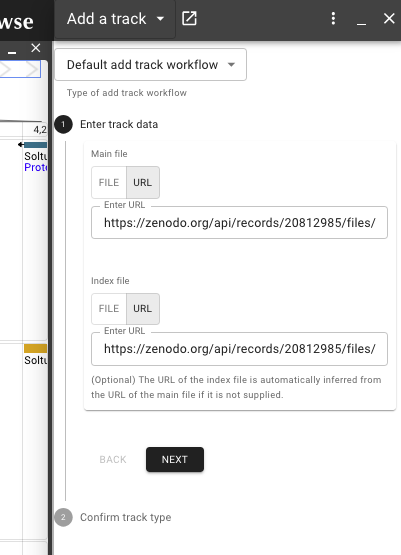
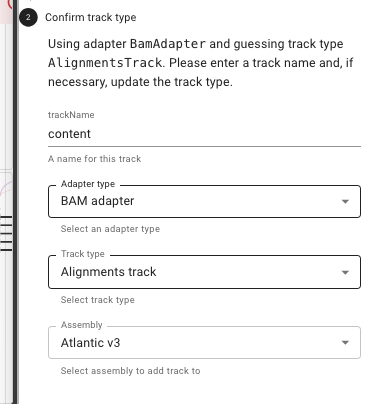

## Sorting and coloring by haplotype

Pileup setting > Color by ... > Color by tag ...

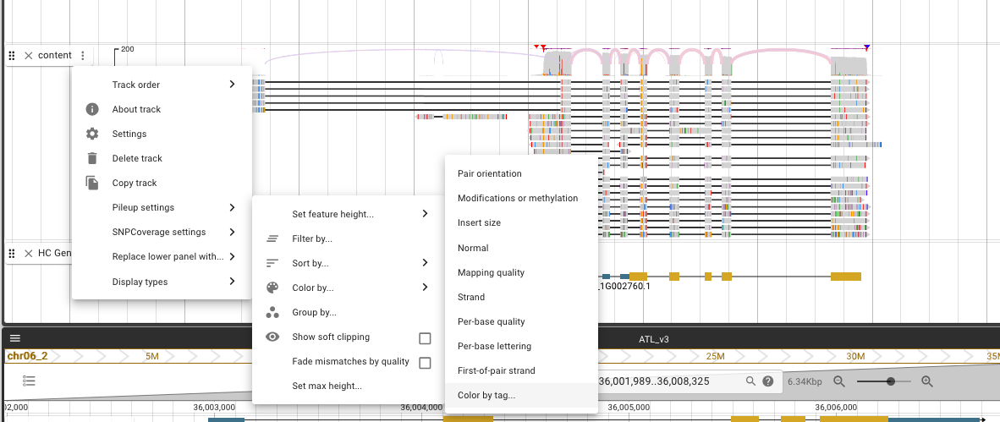

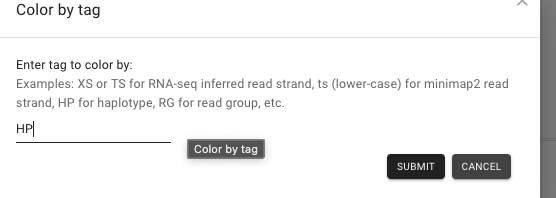


You can do the same for `Sort by`. The sorting position is the middle of the screen.

If there are too many reads aligned: 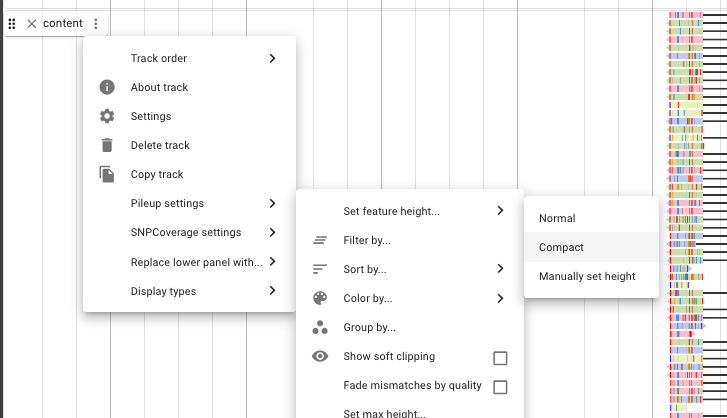

### Info about the long-read RNA-seq BAM file

The reads are from a single sample and have been downsampled — they are intended for quality control, not quantification. Each read has been tagged with the haplotype it aligns to most confidently, using the HP tag, which can be used to color and sort the reads in a genome browser.


Let's try another gene, "Ferritin":

In [47]:
results[results["gene_id"].str.contains("Soltu.DM.09G009070")]

,Synt_id,allele,functional_annotation,gene_id,p_value,ratio_difference,n_alleles,ratios_leaf_mean,ratios_rep_leaf,cpm_leaf_mean,cpm_rep_leaf,FDR
672,Synt_id_49718,hap3,ferritin/ferritin,Soltu.DM.09G009070.Hap3,2.271902e-07,0.291701,4,0.528636,"[0.6, 0.5714285714285714, 0.5512820512820513, ...",31.654669,"[29.66627720169417, 29.926166535999428, 39.545...",0.000004
673,Synt_id_49718,hap1,ferritin/ferritin,Soltu.DM.09G009070.Hap1,5.913231e-07,0.176705,4,0.082137,"[0.046153846153846156, 0.07142857142857142, 0....",4.832219,"[2.282021323207244, 3.7407708169999285, 4.9048...",0.000010
675,Synt_id_49718,hap4,ferritin/ferritin,Soltu.DM.09G009070.Hap4,4.065215e-03,0.067255,4,0.181417,"[0.12307692307692308, 0.17261904761904762, 0.1...",10.935296,"[6.0853901952193175, 9.040196141083161, 12.568...",0.015577
674,Synt_id_49718,hap2,ferritin/ferritin,Soltu.DM.09G009070.Hap2,2.164183e-02,0.051432,4,0.207810,"[0.23076923076923078, 0.18452380952380953, 0.2...",12.288058,"[11.41010661603622, 9.663657943916483, 14.7145...",0.060568


Look at the alignment of ferritin in jBrowse by searching `Soltu.Atl_v3.09_1G002760`. Does this look like a gene with "real" allelic imbalance?

## Questions:

1) Which of the two genes (ferritin or Transcription initiation factor TFIIE) has really an allelic imbalances expression?

2) with of the ferritin allels has the highest expression based on the expression plot (find it in the above plot) and based on the alignment? 

# 4) Analysis of differential isoform usage between haplotypes

### Why look beyond total expression?

So far we have tested whether each allele contributes its expected ~25% share of total read counts (allelic *expression* imbalance). But alleles of the same gene can also disagree on **which isoform (splice variant) is the dominant one**, even when their total expression is balanced. For example, one haplotype could mostly produce a transcript that includes an extra exon, while another mostly produces a shorter transcript that skips it.

This is called **differential isoform usage (DIU)**, and it is a structural/cis-regulatory signal that a purely expression-level comparison would miss. To test for it, we compare the *exon/intron structure* of the dominant transcript on each haplotype, not just its read count.

In [22]:
adata_isoform_filtered = poly.filter_low_expressed_genes(
    adata_isoform[adata_isoform.obs['condition'] == 'leaf',: ],
    min_expression=20.0,  # 20 counts
    mode= 'all',
    layer = 'em_counts',
    group_col = 'Synt_id',
    verbose=True)


Using uniform threshold: 20.0
Filtered out 84105 groups
Kept 30295 / 250224 items


In [ ]:
bambu = f"{input_dir}/custom/combined.fixed.gtf"

In [24]:
#First add exon structure information to your AnnData object
gtf_file = bambu

# Add structure information (this can take some time)
poly.add_structure_from_gtf(adata_isoform_filtered, 
                            gtf_file, 
                            inplace=True, 
                            verbose=True)


Loading GTF file: /scratch/nadjafn/polyase_tutorial_atlantic/custom/combined.fixed.gtf
Processing exon structures...
Processed 250224 transcripts
Exon count distribution:
n_exons
1     70765
2     53581
3     32202
4     19639
5     14515
6     11146
7      9139
8      7440
9      6317
10     5105
Name: count, dtype: int64
Calculated introns for 179459 multi-exon transcripts
Intron count distribution:
n_introns
1     53581
2     32202
3     19639
4     14515
5     11146
6      9139
7      7440
8      6317
9      5105
10     3976
Name: count, dtype: int64
Adding structure information to AnnData.var...
Matched structure information for 30295/30295 transcripts
Successfully added exon structure information for 250224 transcripts
  - Intron structures calculated for multi-exon transcripts


In [25]:
adata_isoform_filtered = poly.calculate_allelic_ratios(adata_isoform_filtered, 'unique_counts')
adata_isoform_filtered = poly.calculate_multi_ratios(adata_isoform_filtered, 'unique_counts', 'ambiguous_counts')
adata_isoform_filtered = poly.calculate_per_allele_ratios(adata_isoform_filtered, unique_layer='unique_counts', multi_layer='ambiguous_counts')

#### Key terms used in this analysis

Because each haplotype is annotated independently, the same gene can have differently-numbered isoforms per haplotype, and annotation quality can differ between haplotypes (recall the CDS-length QC step above — annotation errors like a truncated or split gene model on some haplotypes are exactly this kind of problem). So we can't just compare "isoform 1 vs isoform 1" by name — the function first has to figure out which isoform on each haplotype is structurally the *same* transcript. For each gene (`Synt_id`), `poly.test_differential_isoform_structure` does the following:

1. **Reference haplotype**: the haplotype with the highest total read count for this gene. It is treated as the most reliable/complete annotation and gives the most statistical power.
2. **Major isoform**: within the reference haplotype, its most highly expressed transcript. This is the isoform we try to find on the other three haplotypes. (**Minor isoform**: the second most expressed transcript in the reference haplotype — used only as a fallback if the major isoform can't be matched everywhere.)
3. **Structural matching**: for every other haplotype, each of its transcripts is scored against the reference's major isoform using a similarity score from 0–1 that combines the exon-length pattern (60% weight) and intron-length pattern (40% weight). The best match above `min_similarity_for_matching` (here `0.8`, i.e. 80% structural similarity) is accepted as "the same isoform on this haplotype." If nothing reaches that threshold, the haplotype is left unmatched for this gene.
4. **The test**: once the major (or minor, as fallback) isoform is matched on at least 2 haplotypes, a likelihood-ratio test compares — per haplotype — what fraction of that haplotype's total reads for the gene support the matched isoform, against the same fraction in the reference haplotype. A significant difference means that haplotype routes a different proportion of its reads to the dominant isoform than the reference does — i.e. differential isoform usage.

In the `DEBUG:` output below (printed only for the first 3 genes, just to illustrate the logic), `sim=0.992` is the structural similarity score from step 3, and `Matched to MAJOR` means that haplotype's isoform was accepted as the same transcript as the reference's major isoform.

In [42]:
mask =(adata_isoform_filtered.var["tx_multimapping_ratio_per_allele_weighted_average"] < 0.6) & \
      (adata_isoform_filtered.var["synteny_category"] == "1hap1_1hap2_1hap3_1hap4_s")

#mask = adata_isoform_filtered.var["Synt_id"] == "Synt_id_59067"
adata_isoform_multimapping_filtered = adata_isoform_filtered[:,mask].copy()


#  Run structure-based DIU analysis
results_DIU_allele, results_DIU_plotting = poly.test_differential_isoform_structure(
    adata_isoform_multimapping_filtered, 
    layer="em_counts",
    test_condition="all",  # or "all" to use all conditions
    min_similarity_for_matching=0.8,
    inplace=True, 
    verbose = False,

)

DEBUG: Found 5 samples for condition 'all'
DEBUG: Found 1272 syntelogs to process

DEBUG Syntelog Synt_id_61515: 4 haplotypes, 4 transcripts
DEBUG: Haplotype expressions: {'hap1': np.float64(338.3650969338155), 'hap2': np.float64(323.0998473577558), 'hap4': np.float64(385.3849826839387), 'hap3': np.float64(316.15007302449)}
DEBUG: Selected reference haplotype: hap4 (expression=385.3849826839387)
DEBUG: Reference haplotype hap4 has 1 isoforms
  Soltu.DM.12G021880.1.Hap4: expression=385.3849826839387
  hap1: Matched to MAJOR (Soltu.DM.12G021880.1.Hap1, sim=1.000)
  hap2: Matched to MAJOR (Soltu.DM.12G021880.1.Hap2, sim=1.000)
  hap3: Matched to MAJOR (Soltu.DM.12G021880.1.Hap3, sim=1.000)
DEBUG: Found 4 haplotype matches
DEBUG: Major on all haplotypes: True
DEBUG: Testing using MAJOR isoform
DEBUG: Reference counts: [ 33.93558341  62.67157796 164.5070571 ], totals: [ 33.93558341  62.67157796 164.5070571 ]

DEBUG Syntelog Synt_id_29563: 4 haplotypes, 12 transcripts
DEBUG: Haplotype expres

#### Reading the results

Not every gene can be tested — the `Detailed failure reasons` printed above break down why:

- `single_haplotype`: after filtering, this gene only has transcripts left on one haplotype, so there's nothing to compare it to.
- `no_matches`: none of the other haplotypes had an isoform reaching the `min_similarity_for_matching` threshold against the reference, so we can't be confident we'd be comparing the same transcript.
- `zero_counts`: a match was found, but one side has zero reads in this condition, so the test can't be run.

Of the 941 genes that could be tested, `Found 12 ... genes with at least one significantly different isoform (FDR < 0.05 and ratio difference > 0.2)` are candidates for differential isoform usage — for these genes, at least one haplotype consistently routes a different proportion of its reads to the dominant isoform than the reference haplotype does.

#### Question

Why do you think the test always compares each haplotype *against the reference haplotype*, rather than testing all four haplotypes against each other directly?

#### Answer

Because haplotypes are annotated independently, we don't know in advance which isoform on haplotype 2, 3 or 4 corresponds to which isoform on haplotype 1 — we need a "ruler" to match against first. The reference haplotype (the one with the most reads, and therefore the most reliable evidence for which isoforms genuinely exist) acts as that ruler: every other haplotype's dominant isoform is matched to it by structural similarity, then tested against it. Comparing all four haplotypes pairwise without first picking a reference would multiply both the number of uncertain isoform-matching decisions and the number of statistical tests, with no clear baseline to interpret the result against.

In [27]:
# we use the original unitato annotations as they contain CDS information
ensembl_gtf_path = f"{input_dir}/unitato2Atl.with_chloroplast_and_mito.no_scaffold.agat.gtf"
annotation = RNApy.read_ensembl_gtf(ensembl_gtf_path)

# add the bambu annotations to the annotation dataframe to also include novel isoforms and genes
bambu = f"{input_dir}/custom/combined.fixed.gtf"
bambu_annotation = RNApy.read_ensembl_gtf(bambu)
bambu_annotation = bambu_annotation.filter(pl.col("transcript_id").str.contains("Bambu"))


annotation.extend(bambu_annotation)
annotation_df = annotation.to_pandas()
annotation_df['gene_id_unitato'] = annotation_df['gene_id'].str.rsplit('.', n=1).str[0]

# back to polar
annotation_pl = pl.from_pandas(annotation_df)

In [28]:
fig = poly.plot_allele_specific_isoform_structure(results_DIU_plotting[results_DIU_plotting['gene_id'].str.contains("Soltu.DM.11G023050")],
                                                  annotation_df = annotation_pl, 
                                                  ratio_difference_threshold=0.2)


Detected layer: isoform (using column: isoform_cpm)
Found 1 syntelogs with significant allelic differences. Plotting all isoforms for these syntelogs.
Processing Synt_id: Synt_id_59067
Gene: Soltu.DM.11G023050.Hap3


Generated 1 plots for allele-specific isoform structure


## Questions:
1) Which of the alleles has a different isoform dominantly expressed of the Soltu.DM.11G023050 gene? --> search "Soltu.Atl_v3.11_1G016430"

2) What do you think is the reason for the difference in isoforms between haplotypes?

### Resources and Code

**All pipelines under active development**

Documentatino of whole [pipeline](https://polyase.readthedocs.io/en/latest/#)

1) Grouping of genes in phased assemblies to alleles [nextflow pipeline](https://github.com/NIB-SI/potato-allelic-orthogroups/tree/main)

2) How to get allele specific counts [nextflow pipeline](https://github.com/nadjano/longrnaseq)

3) Allele specific expression analysis: 
[Polyase package](https://test.pypi.org/project/polyase/)
